In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, TruncatedSVD
import matplotlib.patches as mpatches
import time

# Classifier Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import collections


# Other Libraries
from sklearn import preprocessing 
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report
from collections import Counter
from sklearn.model_selection import KFold, StratifiedKFold
import warnings

from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import regularizers

warnings.filterwarnings("ignore")


df = pd.read_csv('./creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


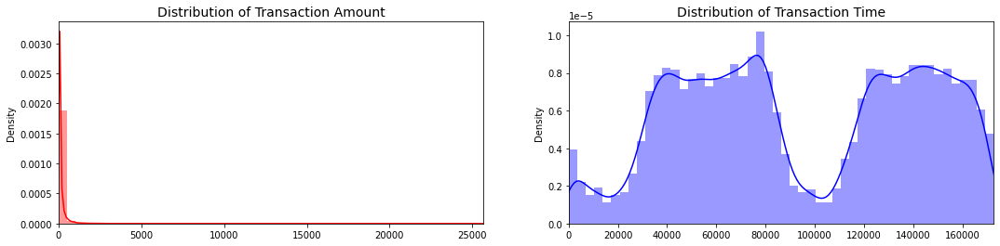

In [2]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

amount_val = df['Amount'].values
time_val = df['Time'].values

sns.distplot(amount_val, ax=ax[0], color='r')
ax[0].set_title('Distribution of Transaction Amount', fontsize=14)
ax[0].set_xlim([min(amount_val), max(amount_val)])

sns.distplot(time_val, ax=ax[1], color='b')
ax[1].set_title('Distribution of Transaction Time', fontsize=14)
ax[1].set_xlim([min(time_val), max(time_val)])



plt.show()

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit

print('No Frauds', round(df['Class'].value_counts()[0]/len(df) * 100,2), '% of the dataset')
print('Frauds', round(df['Class'].value_counts()[1]/len(df) * 100,2), '% of the dataset')

X = df.drop('Class', axis=1)
y = df['Class']

sss = StratifiedKFold(n_splits=5, random_state=None, shuffle=False)

for train_index, test_index in sss.split(X, y):
    print("Train:", train_index, "Test:", test_index)
    original_Xtrain, original_Xtest = X.iloc[train_index], X.iloc[test_index]
    original_ytrain, original_ytest = y.iloc[train_index], y.iloc[test_index]

# We already have X_train and y_train for undersample data thats why I am using original to distinguish and to not overwrite these variables.
# original_Xtrain, original_Xtest, original_ytrain, original_ytest = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the Distribution of the labels


# Turn into an array
original_Xtrain = original_Xtrain.values
original_Xtest = original_Xtest.values
original_ytrain = original_ytrain.values
original_ytest = original_ytest.values

# See if both the train and test label distribution are similarly distributed
train_unique_label, train_counts_label = np.unique(original_ytrain, return_counts=True)
test_unique_label, test_counts_label = np.unique(original_ytest, return_counts=True)
print('-' * 100)

print('Label Distributions: \n')
print('Normal         Abnormal')
print(train_counts_label/ len(original_ytrain))
print(test_counts_label/ len(original_ytest))

No Frauds 99.83 % of the dataset
Frauds 0.17 % of the dataset
Train: [ 30473  30496  31002 ... 284804 284805 284806] Test: [    0     1     2 ... 57017 57018 57019]
Train: [     0      1      2 ... 284804 284805 284806] Test: [ 30473  30496  31002 ... 113964 113965 113966]
Train: [     0      1      2 ... 284804 284805 284806] Test: [ 81609  82400  83053 ... 170946 170947 170948]
Train: [     0      1      2 ... 284804 284805 284806] Test: [150654 150660 150661 ... 227866 227867 227868]
Train: [     0      1      2 ... 227866 227867 227868] Test: [212516 212644 213092 ... 284804 284805 284806]
----------------------------------------------------------------------------------------------------
Label Distributions: 

Normal         Abnormal
[0.99827076 0.00172924]
[0.99827952 0.00172048]


Random Undersampling

In [42]:
# Since our classes are highly skewed we should make them equivalent in order to have a normal distribution of the classes.

# Lets shuffle the data before creating the subsamples

df = df.sample(frac=1)

# amount of fraud classes 492 rows.
fraud_df = df.loc[df['Class'] == 1]
non_fraud_df = df.loc[df['Class'] == 0].sample(14760)

normal_distributed_df = pd.concat([fraud_df, non_fraud_df])

# Shuffle dataframe rows
new_df = normal_distributed_df.sample(frac=1, random_state=42)

new_df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
2457,2022.0,-4.214582,2.395879,-0.600196,-2.425047,1.993984,5.698067,-4.135542,-10.398561,1.730811,...,10.569625,-3.377947,0.978754,0.930299,0.101910,1.039669,0.217969,-0.224318,1.00,0
264991,161682.0,0.139633,0.631453,0.498235,-0.139839,0.412706,-0.297213,0.636068,-0.116330,-0.154660,...,0.000098,0.125638,-0.182816,-0.589029,-0.201532,0.757276,0.010084,0.021653,15.00,0
189520,128439.0,2.151777,-1.618732,-1.032884,-1.539458,-1.209859,-0.525395,-0.983834,-0.285107,-1.202200,...,-0.135793,-0.019274,0.074889,-0.643510,-0.162881,-0.150360,0.008892,-0.034974,109.50,0
129328,79044.0,-3.755292,1.727435,-0.711969,0.209964,0.065522,1.139946,-3.201440,-3.716367,-0.567459,...,-2.756147,0.063059,-0.367835,-1.336745,0.079742,-0.600198,-0.029553,-0.337674,6.91,0
1397,1082.0,-1.582447,-0.003459,0.647639,0.348056,0.588689,-0.653231,-0.126394,0.434074,-0.004568,...,-0.163526,-0.524740,-0.045022,-0.412762,0.238437,0.280377,-0.013852,-0.008096,20.07,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225550,144293.0,2.161229,0.206367,-2.612839,0.268636,0.965359,-1.409323,0.968401,-0.557379,0.163413,...,0.269930,0.945118,-0.188518,0.723746,0.842321,0.096020,-0.085402,-0.081324,0.76,0
70503,53896.0,-1.132227,0.957403,1.283987,-0.703670,0.183261,-0.630489,0.339379,0.469346,-0.499991,...,-0.314495,-1.297821,-0.154255,-0.520109,0.196449,0.074938,-0.151450,-0.043143,3.87,0
252779,155965.0,-0.514035,0.304079,0.155595,-0.228260,1.109021,-1.463916,0.697317,-0.310883,-0.094893,...,0.423877,1.224644,-0.159556,0.030701,-0.475736,-0.177538,0.041600,0.319037,1.00,0
83075,59676.0,-1.959235,1.918586,-0.112283,-0.792384,-0.733897,-0.650732,-0.425456,1.356369,0.073066,...,-0.191418,-0.683806,-0.002234,-0.472058,0.036982,0.364338,0.129435,0.103060,1.00,0


Distribution of the Classes in the subsample dataset
0    0.967742
1    0.032258
Name: Class, dtype: float64


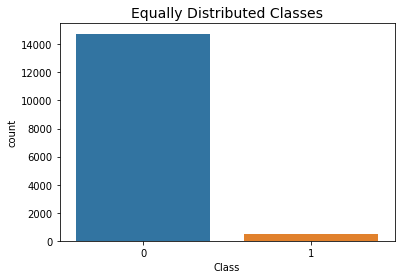

In [43]:
print('Distribution of the Classes in the subsample dataset')
print(new_df['Class'].value_counts()/len(new_df))



sns.countplot('Class', data=new_df)
plt.title('Equally Distributed Classes', fontsize=14)
plt.show()

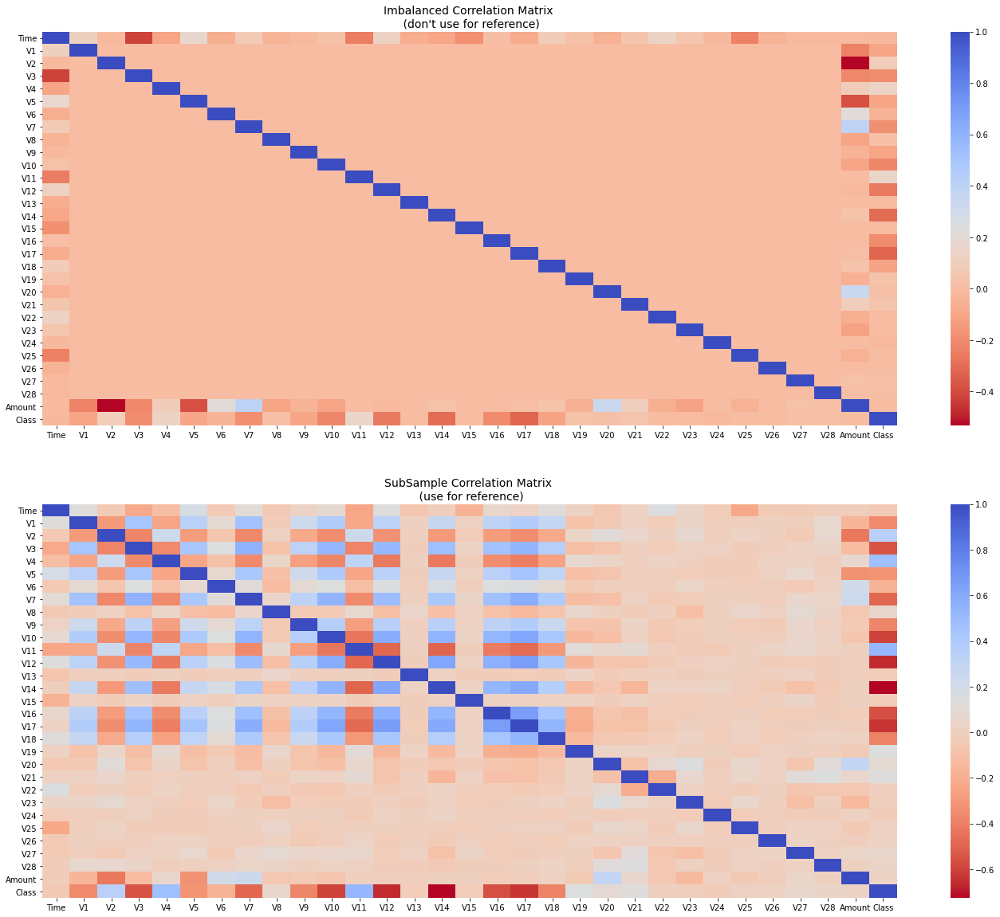

In [44]:
# Make sure we use the subsample in our correlation

f, (ax1, ax2) = plt.subplots(2, 1, figsize=(24,20))

# Entire DataFrame
corr = df.corr()
sns.heatmap(corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax1)
ax1.set_title("Imbalanced Correlation Matrix \n (don't use for reference)", fontsize=14)


sub_sample_corr = new_df.corr()
sns.heatmap(sub_sample_corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax2)
ax2.set_title('SubSample Correlation Matrix \n (use for reference)', fontsize=14)
plt.show()

In [45]:
## input layer 
input_layer = Input(shape=(X.values.shape[1],))

## encoding part
encoded = Dense(100, activation='tanh', activity_regularizer=regularizers.l1(10e-5))(input_layer)
encoded = Dense(50, activation='relu')(encoded)

## decoding part
decoded = Dense(50, activation='tanh')(encoded)
decoded = Dense(100, activation='tanh')(decoded)

## output layer
output_layer = Dense(X.shape[1], activation='relu')(decoded)

In [46]:
autoencoder = Model(input_layer, output_layer)
autoencoder.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 30)]              0         
_________________________________________________________________
dense_5 (Dense)              (None, 100)               3100      
_________________________________________________________________
dense_6 (Dense)              (None, 50)                5050      
_________________________________________________________________
dense_7 (Dense)              (None, 50)                2550      
_________________________________________________________________
dense_8 (Dense)              (None, 100)               5100      
_________________________________________________________________
dense_9 (Dense)              (None, 30)                3030      
Total params: 18,830
Trainable params: 18,830
Non-trainable params: 0
_______________________________________________________

In [47]:
autoencoder.compile(optimizer="adam", loss="mse",metrics=['accuracy'])

In [48]:
auto_x = new_df.drop('Class',axis=1)
auto_y = new_df['Class'].values
x_scale = preprocessing.MinMaxScaler().fit_transform(auto_x.values)
s_auto_x_norm , s_auto_x_fraud = x_scale[auto_y == 0], x_scale[auto_y ==1]
auto_x_norm , auto_x_fraud = auto_x[auto_y == 0], auto_x[auto_y==1]
auto_x_norm

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
2457,2022.0,-4.214582,2.395879,-0.600196,-2.425047,1.993984,5.698067,-4.135542,-10.398561,1.730811,...,-2.500192,10.569625,-3.377947,0.978754,0.930299,0.101910,1.039669,0.217969,-0.224318,1.00
264991,161682.0,0.139633,0.631453,0.498235,-0.139839,0.412706,-0.297213,0.636068,-0.116330,-0.154660,...,0.048368,0.000098,0.125638,-0.182816,-0.589029,-0.201532,0.757276,0.010084,0.021653,15.00
189520,128439.0,2.151777,-1.618732,-1.032884,-1.539458,-1.209859,-0.525395,-0.983834,-0.285107,-1.202200,...,-0.166333,-0.135793,-0.019274,0.074889,-0.643510,-0.162881,-0.150360,0.008892,-0.034974,109.50
129328,79044.0,-3.755292,1.727435,-0.711969,0.209964,0.065522,1.139946,-3.201440,-3.716367,-0.567459,...,0.499827,-2.756147,0.063059,-0.367835,-1.336745,0.079742,-0.600198,-0.029553,-0.337674,6.91
1397,1082.0,-1.582447,-0.003459,0.647639,0.348056,0.588689,-0.653231,-0.126394,0.434074,-0.004568,...,0.158311,-0.163526,-0.524740,-0.045022,-0.412762,0.238437,0.280377,-0.013852,-0.008096,20.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225550,144293.0,2.161229,0.206367,-2.612839,0.268636,0.965359,-1.409323,0.968401,-0.557379,0.163413,...,-0.290202,0.269930,0.945118,-0.188518,0.723746,0.842321,0.096020,-0.085402,-0.081324,0.76
70503,53896.0,-1.132227,0.957403,1.283987,-0.703670,0.183261,-0.630489,0.339379,0.469346,-0.499991,...,-0.196864,-0.314495,-1.297821,-0.154255,-0.520109,0.196449,0.074938,-0.151450,-0.043143,3.87
252779,155965.0,-0.514035,0.304079,0.155595,-0.228260,1.109021,-1.463916,0.697317,-0.310883,-0.094893,...,-0.090748,0.423877,1.224644,-0.159556,0.030701,-0.475736,-0.177538,0.041600,0.319037,1.00
83075,59676.0,-1.959235,1.918586,-0.112283,-0.792384,-0.733897,-0.650732,-0.425456,1.356369,0.073066,...,-0.089855,-0.191418,-0.683806,-0.002234,-0.472058,0.036982,0.364338,0.129435,0.103060,1.00


In [49]:
auto_history = autoencoder.fit(s_auto_x_norm, s_auto_x_norm, batch_size=256, epochs=50, shuffle=True, validation_split=0.2,verbose=1).history


Epoch 1/50
47/47 [==============================] - 1s 5ms/step - loss: 0.1276 - accuracy: 0.4501 - val_loss: 0.0525 - val_accuracy: 0.7148
Epoch 2/50
47/47 [==============================] - 0s 2ms/step - loss: 0.0515 - accuracy: 0.7340 - val_loss: 0.0511 - val_accuracy: 0.7117
Epoch 3/50
47/47 [==============================] - 0s 2ms/step - loss: 0.0506 - accuracy: 0.7385 - val_loss: 0.0505 - val_accuracy: 0.7117
Epoch 4/50
47/47 [==============================] - 0s 2ms/step - loss: 0.0500 - accuracy: 0.7382 - val_loss: 0.0500 - val_accuracy: 0.7039
Epoch 5/50
47/47 [==============================] - 0s 2ms/step - loss: 0.0496 - accuracy: 0.7336 - val_loss: 0.0494 - val_accuracy: 0.6928
Epoch 6/50
47/47 [==============================] - 0s 2ms/step - loss: 0.0481 - accuracy: 0.7123 - val_loss: 0.0342 - val_accuracy: 0.7154
Epoch 7/50
47/47 [==============================] - 0s 2ms/step - loss: 0.0329 - accuracy: 0.6797 - val_loss: 0.0318 - val_accuracy: 0.7192
Epoch 8/50
47/47 [==

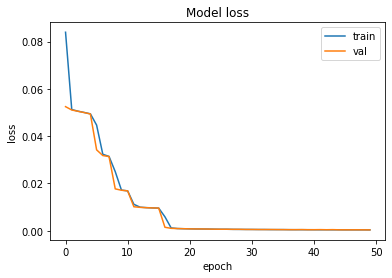

In [53]:
plt.plot(auto_history['loss'])
plt.plot(auto_history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','val'])

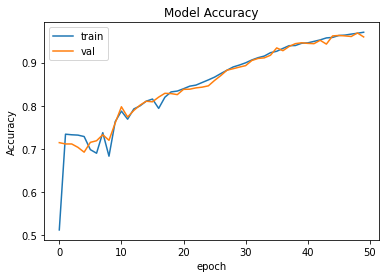

In [54]:
plt.plot(auto_history['accuracy'])
plt.plot(auto_history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['train','val'])

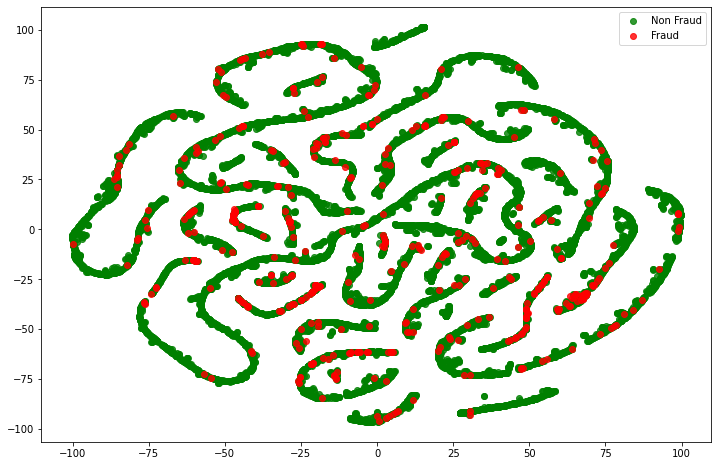

In [55]:
def tsne_plot(x1, y1, name="graph.png"):
    tsne = TSNE(n_components=2, random_state=0)
    X_t = tsne.fit_transform(x1)

    plt.figure(figsize=(12, 8))

    plt.scatter(X_t[np.where(y1 == 0), 0], X_t[np.where(y1 == 0), 1], marker='o', color='g', linewidth=1, alpha=0.8, label='Non Fraud')
    plt.scatter(X_t[np.where(y1 == 1), 0], X_t[np.where(y1 == 1), 1], marker='o', color='r', linewidth=1, alpha=0.8, label='Fraud')

    plt.legend(loc='best')
    plt.show()
    
tsne_plot(auto_x, auto_y, "original.png")

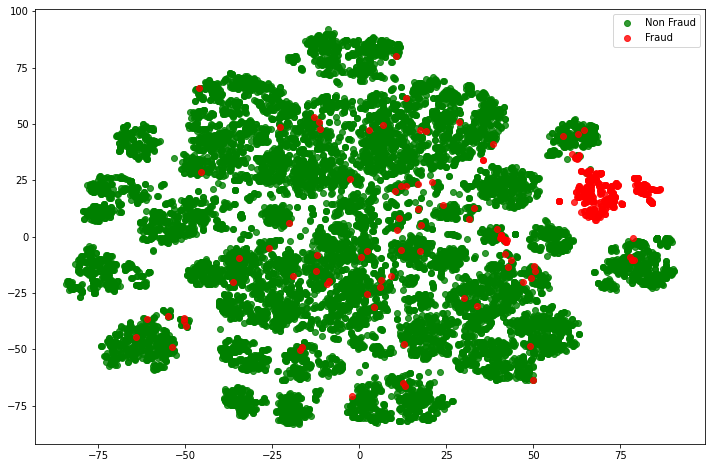

In [56]:
hidden_representation = Sequential()
hidden_representation.add(autoencoder.layers[0])
hidden_representation.add(autoencoder.layers[1])
hidden_representation.add(autoencoder.layers[2])

norm_hid_rep = hidden_representation.predict(s_auto_x_norm)
fraud_hid_rep = hidden_representation.predict(s_auto_x_fraud)

rep_x = np.append(norm_hid_rep, fraud_hid_rep, axis = 0)
y_n = np.zeros(norm_hid_rep.shape[0])
y_f = np.ones(fraud_hid_rep.shape[0])
rep_y = np.append(y_n, y_f)
tsne_plot(rep_x, rep_y, "latent_representation.png")


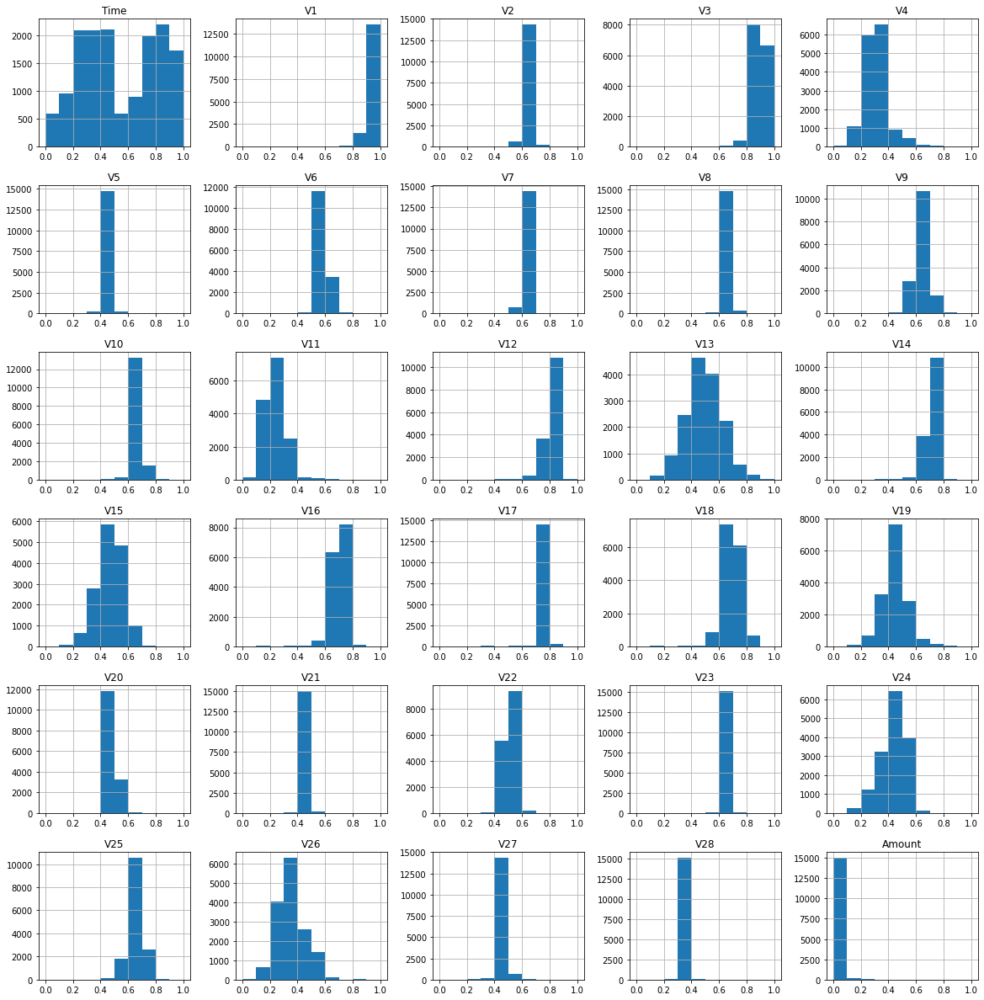

In [259]:
df_x_scale = pd.DataFrame(x_scale,columns=auto_x.columns)
df_x_scale.hist(figsize=(20,21))
plt.show()

In [58]:
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score,confusion_matrix,classification_report

Xtest_scale = preprocessing.MinMaxScaler().fit_transform(original_Xtest)
auto_pred = autoencoder.predict(Xtest_scale)
auto_pred

array([[0.5038662 , 1.1327296 , 0.8122067 , ..., 0.45761976, 0.5776019 ,
        0.        ],
       [0.40656093, 1.0413021 , 0.7379945 , ..., 0.38010538, 0.52225286,
        0.02620009],
       [0.4498107 , 0.94757587, 0.5453407 , ..., 0.36472356, 0.4341636 ,
        0.01631884],
       ...,
       [1.0211545 , 1.0401347 , 0.63211644, ..., 0.36597106, 0.4472351 ,
        0.01391093],
       [1.0861517 , 0.9622816 , 0.6287264 , ..., 0.34938756, 0.41980186,
        0.03260951],
       [1.0322083 , 0.97060484, 0.61652315, ..., 0.3426674 , 0.44273832,
        0.01010542]], dtype=float32)

In [366]:
mse = np.mean(np.power(Xtest_scale - auto_pred,2),axis=1)
print('Threshold: ',np.quantile(mse,0.95))
threshold =np.quantile(mse,0.95)

Threshold:  0.029505649434720768


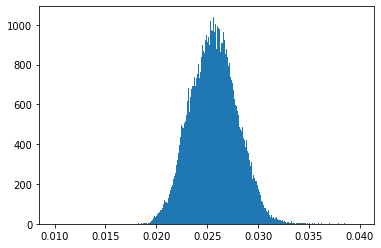

In [367]:
bins = np.arange(0.01, 0.04, 0.0001)
plt.hist(mse,bins=bins)
plt.show()

In [368]:
original_Xtest_df = pd.DataFrame(original_Xtest,columns=auto_x.columns)
original_Xtest_df['MSE'] = mse 
original_Xtest_df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,MSE
0,138894.0,-1.298443,1.948100,-4.509947,1.305805,-0.019486,-0.509238,-2.643398,1.283545,-2.515356,...,1.178032,1.360989,-0.272013,-0.325948,0.290703,0.841295,0.643094,0.201156,0.01,0.108028
1,138942.0,-2.356348,1.746360,-6.374624,1.772205,-3.439294,1.457811,-0.362577,1.443791,-1.927359,...,0.857942,0.621203,0.964817,-0.619437,-1.732613,0.108361,1.130828,0.415703,727.91,0.085341
2,139107.0,-4.666500,-3.952320,0.206094,5.153525,5.229469,0.939040,-0.635033,-0.704506,-0.234786,...,-0.664263,1.821422,0.113563,-0.759673,-0.502304,0.630639,-0.513880,0.729526,22.47,0.034073
3,139117.0,-3.975939,-1.244939,-3.707414,4.544772,4.050676,-3.407679,-5.063118,1.007042,-3.190158,...,1.059737,-0.037395,0.348707,-0.162929,0.410531,-0.123612,0.877424,0.667568,8.30,0.085909
4,139767.0,0.467992,1.100118,-5.607145,2.204714,-0.578539,-0.174200,-3.454201,1.102823,-1.065016,...,0.983481,0.899876,-0.285103,-1.929717,0.319869,0.170636,0.851798,0.372098,120.54,0.082551


In [369]:
original_Xtest_df['Mse_outlier'] = 0
original_Xtest_df.loc[original_Xtest_df['MSE'] > threshold,'Mse_outlier'] = 1
original_Xtest_df['Class'] = original_ytest
original_Xtest_df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V23,V24,V25,V26,V27,V28,Amount,MSE,Mse_outlier,Class
0,138894.0,-1.298443,1.948100,-4.509947,1.305805,-0.019486,-0.509238,-2.643398,1.283545,-2.515356,...,-0.272013,-0.325948,0.290703,0.841295,0.643094,0.201156,0.01,0.108028,1,1
1,138942.0,-2.356348,1.746360,-6.374624,1.772205,-3.439294,1.457811,-0.362577,1.443791,-1.927359,...,0.964817,-0.619437,-1.732613,0.108361,1.130828,0.415703,727.91,0.085341,1,1
2,139107.0,-4.666500,-3.952320,0.206094,5.153525,5.229469,0.939040,-0.635033,-0.704506,-0.234786,...,0.113563,-0.759673,-0.502304,0.630639,-0.513880,0.729526,22.47,0.034073,1,1
3,139117.0,-3.975939,-1.244939,-3.707414,4.544772,4.050676,-3.407679,-5.063118,1.007042,-3.190158,...,0.348707,-0.162929,0.410531,-0.123612,0.877424,0.667568,8.30,0.085909,1,1
4,139767.0,0.467992,1.100118,-5.607145,2.204714,-0.578539,-0.174200,-3.454201,1.102823,-1.065016,...,-0.285103,-1.929717,0.319869,0.170636,0.851798,0.372098,120.54,0.082551,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56956,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0.026377,0,0
56957,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0.023646,0,0
56958,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0.023773,0,0
56959,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0.023482,0,0


In [370]:
print('---' * 45)
print('Recall Score: {:.2f}'.format(recall_score(original_Xtest_df['Class'].values, original_Xtest_df['Mse_outlier'].values)))
print('Precision Score: {:.2f}'.format(precision_score(original_Xtest_df['Class'].values, original_Xtest_df['Mse_outlier'].values)))
print('F1 Score: {:.2f}'.format(f1_score(original_Xtest_df['Class'].values, original_Xtest_df['Mse_outlier'].values)))
print('Accuracy Score: {:.2f}'.format(accuracy_score(original_Xtest_df['Class'].values, original_Xtest_df['Mse_outlier'].values)))
print('---' * 45)

---------------------------------------------------------------------------------------------------------------------------------------
Recall Score: 0.82
Precision Score: 0.03
F1 Score: 0.05
Accuracy Score: 0.95
---------------------------------------------------------------------------------------------------------------------------------------


In [371]:
print(classification_report(original_Xtest_df['Class'].values, original_Xtest_df['Mse_outlier'].values))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97     56863
           1       0.03      0.82      0.05        98

    accuracy                           0.95     56961
   macro avg       0.51      0.88      0.51     56961
weighted avg       1.00      0.95      0.97     56961



In [372]:
confusion_matrix(original_Xtest_df['Class'].values, original_Xtest_df['Mse_outlier'].values)

array([[54095,  2768],
       [   18,    80]], dtype=int64)

In [373]:
roc_auc_score(original_Xtest_df['Class'].values, original_Xtest_df['Mse_outlier'].values)

0.883824064068059

In [148]:
from sklearn.ensemble import IsolationForest
from sklearn.cluster import KMeans
iso=IsolationForest(n_estimators=100, max_samples= len(x_scale),contamination = 0.001727485630620034,n_jobs=5, random_state=42)
iso_history = iso.fit(x_scale)
iso_dec = iso_history.decision_function(Xtest_scale)#Xtest_scale#original_Xtest

In [393]:
print('Threshold: ',np.quantile(1 - iso_dec,0.95))
isothreshold =np.quantile(1 - iso_dec,0.95)

Threshold:  1.044892634146658


In [394]:
iso_df = pd.DataFrame(original_Xtest,columns=auto_x.columns)
iso_df['outlier'] = 0
iso_df["iso_dec"] = iso_dec
iso_df.loc[iso_df['iso_dec'] < (1-isothreshold),'outlier'] = 1
iso_df['Class']= original_ytest

In [395]:
roc_auc_score(original_ytest,iso_df['outlier'].values)

0.8122723897430524

In [296]:
iso_cnf = confusion_matrix(original_ytest,iso_df['outlier'].values)
iso_cnf

array([[34162, 22701],
       [   15,    83]], dtype=int64)

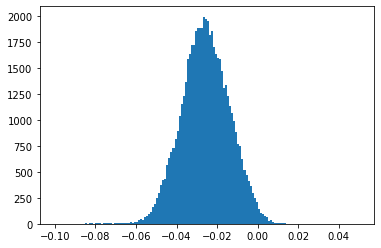

In [273]:
bins = np.arange(-0.1, 0.05, 0.001)
plt.hist(iso_dec,bins=bins)
plt.show()

In [274]:
iso_pre = iso_history.predict(original_Xtest)
iso_df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V23,V24,V25,V26,V27,V28,Amount,outlier,iso_dec,Class
0,138894.0,-1.298443,1.948100,-4.509947,1.305805,-0.019486,-0.509238,-2.643398,1.283545,-2.515356,...,-0.272013,-0.325948,0.290703,0.841295,0.643094,0.201156,0.01,1,-0.088839,1
1,138942.0,-2.356348,1.746360,-6.374624,1.772205,-3.439294,1.457811,-0.362577,1.443791,-1.927359,...,0.964817,-0.619437,-1.732613,0.108361,1.130828,0.415703,727.91,1,-0.077279,1
2,139107.0,-4.666500,-3.952320,0.206094,5.153525,5.229469,0.939040,-0.635033,-0.704506,-0.234786,...,0.113563,-0.759673,-0.502304,0.630639,-0.513880,0.729526,22.47,0,-0.034539,1
3,139117.0,-3.975939,-1.244939,-3.707414,4.544772,4.050676,-3.407679,-5.063118,1.007042,-3.190158,...,0.348707,-0.162929,0.410531,-0.123612,0.877424,0.667568,8.30,1,-0.084872,1
4,139767.0,0.467992,1.100118,-5.607145,2.204714,-0.578539,-0.174200,-3.454201,1.102823,-1.065016,...,-0.285103,-1.929717,0.319869,0.170636,0.851798,0.372098,120.54,1,-0.075243,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56956,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0,-0.039282,0
56957,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0,-0.027850,0
56958,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0,-0.012538,0
56959,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0,-0.025277,0


In [177]:
iso_score = classification_report(original_ytest,iso_df['outlier'].values)
print(iso_score)

              precision    recall  f1-score   support

           0       1.00      0.90      0.95     56863
           1       0.01      0.73      0.02        98

    accuracy                           0.90     56961
   macro avg       0.51      0.82      0.49     56961
weighted avg       1.00      0.90      0.95     56961



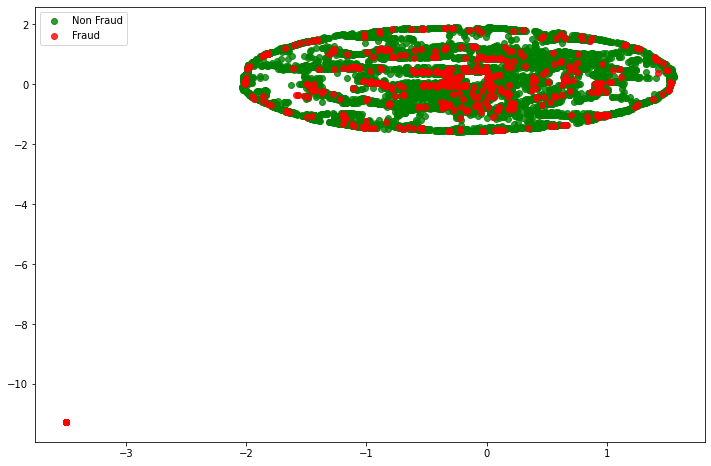

In [178]:
iso_norm_p = iso_history.predict(s_auto_x_norm)
iso_fraud_p= iso_history.predict(s_auto_x_fraud)
irep_x = np.append(iso_norm_p, iso_fraud_p, axis = 0).reshape(-1,1)
iy_n = np.zeros(iso_norm_p.shape[0])
iy_f = np.ones(iso_fraud_p.shape[0])
irep_y = np.append(iy_n, iy_f).reshape(-1,1)
tsne_plot(irep_x, irep_y, "latent_representation.png")

In [218]:

km_model = KMeans(n_clusters=100,random_state=42,n_jobs=-1)

km_model.fit(x_scale)
km_clusters = km_model.predict(Xtest_scale)
km_clusters_centers=km_model.cluster_centers_

In [420]:
dist = [np.linalg.norm(x-y) for x,y in zip(Xtest_scale,km_clusters_centers[km_clusters])]

km_y_pred=np.array(dist)
km_y_pred[dist>=np.percentile(dist,95)]=1
km_y_pred[dist<np.percentile(dist,95)]=0

In [421]:
roc_auc_score(original_ytest,km_y_pred)

0.6640494141486502

In [314]:
km_cnf = confusion_matrix(original_ytest,km_y_pred)
km_cnf

array([[54051,  2812],
       [   61,    37]], dtype=int64)

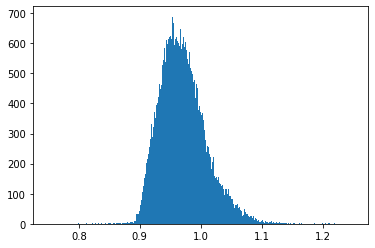

In [252]:
bins = np.arange(0.75, 1.25, 0.001)
plt.hist(dist, bins=bins)
plt.show()

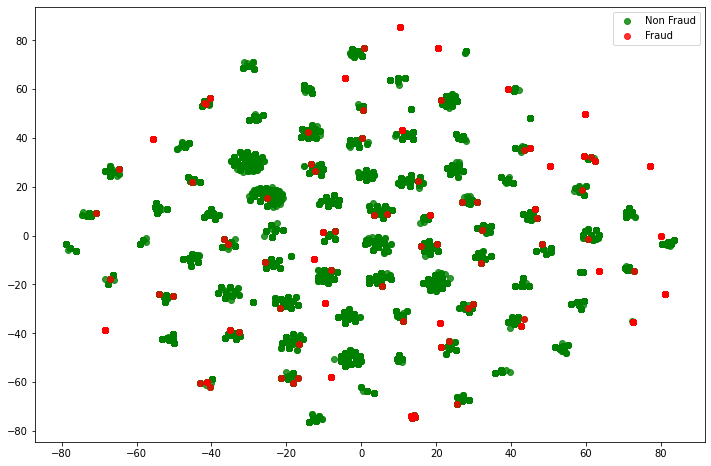

In [253]:
km_norm_p = km_model.predict(s_auto_x_norm)
km_fraud_p= km_model.predict(s_auto_x_fraud)

krep_x = np.append(km_norm_p, km_fraud_p, axis = 0).reshape(-1,1)
ky_n = np.zeros(km_norm_p.shape[0])
ky_f = np.ones(km_fraud_p.shape[0])
krep_y = np.append(ky_n, ky_f).reshape(-1,1)
tsne_plot(krep_x, krep_y, "latent_representation.png")
